## Reverse Image Search - Baseline (30 points)


In [1]:
# from https://github.com/leelamanikanta/Reverse_Image_Search
import cv2 as cv
import requests
import os
import numpy as np
import tarfile
from numpy.linalg import norm
import joblib as pickle
from tqdm import tqdm
import os
import PIL
import time
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import gc
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
import math
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.decomposition import PCA

#Database Setup:

In [2]:
url = 'http://vis-www.cs.umass.edu/lfw/lfw.tgz'
r = requests.get(url)
filename = 'lfw.tgz'
foldername = filename.split('.')[0]
open(filename , 'wb').write(r.content)

tar = tarfile.open(filename, "r:gz")
tar.extractall()
tar.close()

#Resnet50
<p>
Now we use Resnet50 model which is trained on the imagenet dataset (http://www.image-net.org/)
to extract the features from the images. In other words we will convert the images in the dataset to feature vectors using Resnet50.
We chose resnet because of the relatively small feature size. It converts images into 2048 convolutional features compared to 25088
features in vgg 19 or 51200 features in inception architectures. It will be easy for the nearest neighbor algorithm to find neighbors
and also it will minimize the effects of Curse_of_dimensionality. https://en.wikipedia.org/wiki/Curse_of_dimensionality
</p>

In [3]:
img_size = 224

#The following is a Resnet50 model without the top layers so we get convolutional features as output instead of the image classification probability.

model = ResNet50(weights='imagenet', include_top=False,input_shape=(img_size, img_size, 3),pooling='max')

#Create the keras image data generator object and extract the features for the images using Resnet50 predict_generator method.

batch_size = 64
root_dir = 'lfw'

img_gen = ImageDataGenerator(preprocessing_function=preprocess_input)

datagen = img_gen.flow_from_directory(root_dir, target_size=(img_size, img_size), batch_size=batch_size, class_mode=None, shuffle=False)

num_images = len(datagen.filenames)
num_epochs = int(math.ceil(num_images / batch_size))

feature_list = model.predict_generator(datagen, num_epochs)

#We have 13233 images in our dataset. Each image is converted into a 2048 feature vector

print("Num images   = ", len(datagen.classes))
print("Shape of feature_list = ", feature_list.shape)

# Get full path for all the images in our dataset

filenames = [root_dir + '/' + s for s in datagen.filenames]

#We will fit the nearest neighbor algorithm to the extracted features. We have picked kd_tree algorithm.

neighbors = NearestNeighbors(n_neighbors=20, algorithm='kd_tree', metric='euclidean')
neighbors.fit(feature_list)

94781440/94765736 [==============================] - 2s 0us/step
Found 13233 images belonging to 5749 classes.


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.


Num images   =  13233
Shape of feature_list =  (13233, 2048)


NearestNeighbors(algorithm='kd_tree', metric='euclidean', n_neighbors=20)

#Format Predictions for Printing

In [4]:
def similar_images(indices):
    plt.figure(figsize=(15,10), facecolor='white')
    plotnumber = 1    
    for index in indices:
        if plotnumber<=len(indices) :
            #5,4 so we can show 20 predictions
            ax = plt.subplot(5,4,plotnumber)
            plt.imshow(mpimg.imread(filenames[index]), interpolation='lanczos')            
            plotnumber+=1
    plt.tight_layout()


#Main Function for Predictions

In [5]:
def predict_face(url, path):
  #Take image from url, load into PILLOW format
  img_url = url
  response = requests.get(img_url)
  img_path = path
  open(img_path, 'wb').write(response.content)

  input_shape = (img_size, img_size, 3)

  img = image.load_img(img_path, target_size=(input_shape[0], input_shape[1]))
  img_array = image.img_to_array(img)
  expanded_img_array = np.expand_dims(img_array, axis=0)
  preprocessed_img = preprocess_input(expanded_img_array)

  #print(preprocessed_img.shape)
  #Make predictions
  test_img_features = model.predict(preprocessed_img, batch_size=1)

  _, indices = neighbors.kneighbors(test_img_features)

  #print(indices.shape)

  #Plot predictions

  plt.imshow(mpimg.imread(img_path), interpolation='lanczos')
  plt.xlabel(img_path.split('.')[0] + '_Original Image',fontsize=20)
  plt.show()

  print('********* Predictions (without PCA) ***********')
  similar_images(indices[0])


  #Perform principle component analysis

  pca = PCA(n_components=100)
  pca.fit(feature_list)
  compressed_features = pca.transform(feature_list)

  neighbors_pca_features = NearestNeighbors(n_neighbors=20, algorithm='kd_tree', metric='euclidean').fit(compressed_features)

  test_img_compressed = pca.transform(test_img_features)
  distances, indices = neighbors_pca_features.kneighbors(test_img_compressed)

  #print(indices.shape)

  #Plot predictions

  plt.imshow(mpimg.imread(img_path), interpolation='lanczos')
  plt.xlabel(img_path.split('.')[0] + '_Original Image',fontsize=20)
  plt.show()
  
  print('********* Predictions (with PCA) ***********')
  similar_images(indices[0])


#Albert Costa

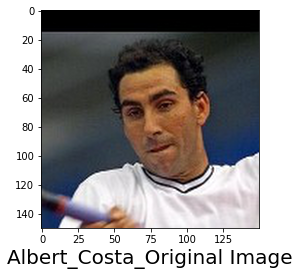

********* Predictions (without PCA) ***********


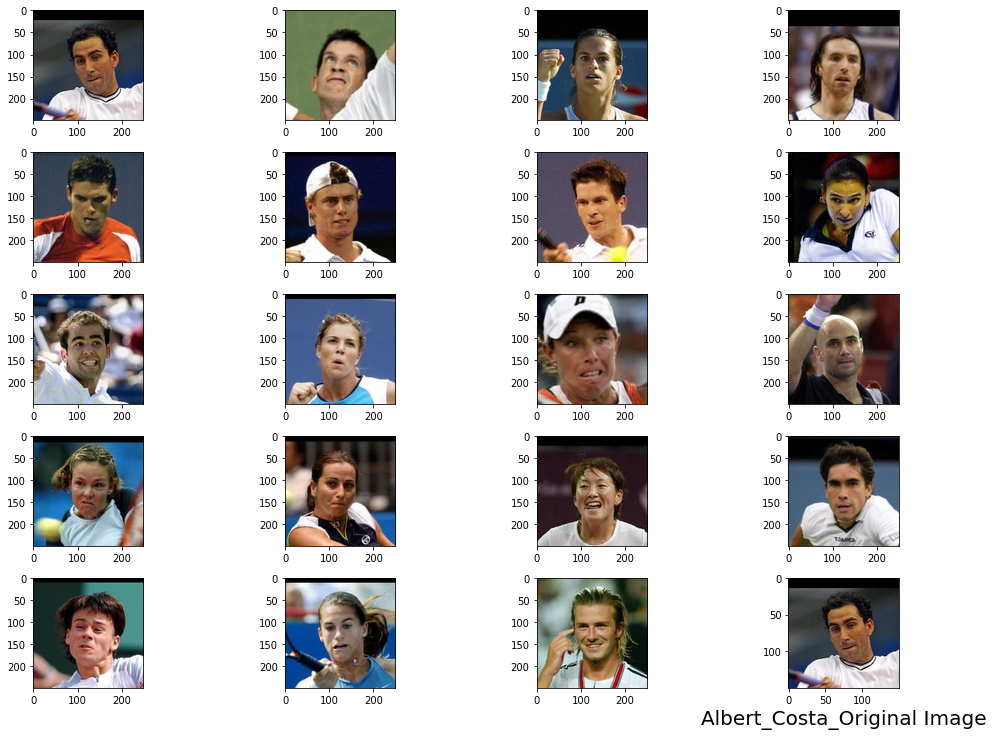

********* Predictions (with PCA) ***********


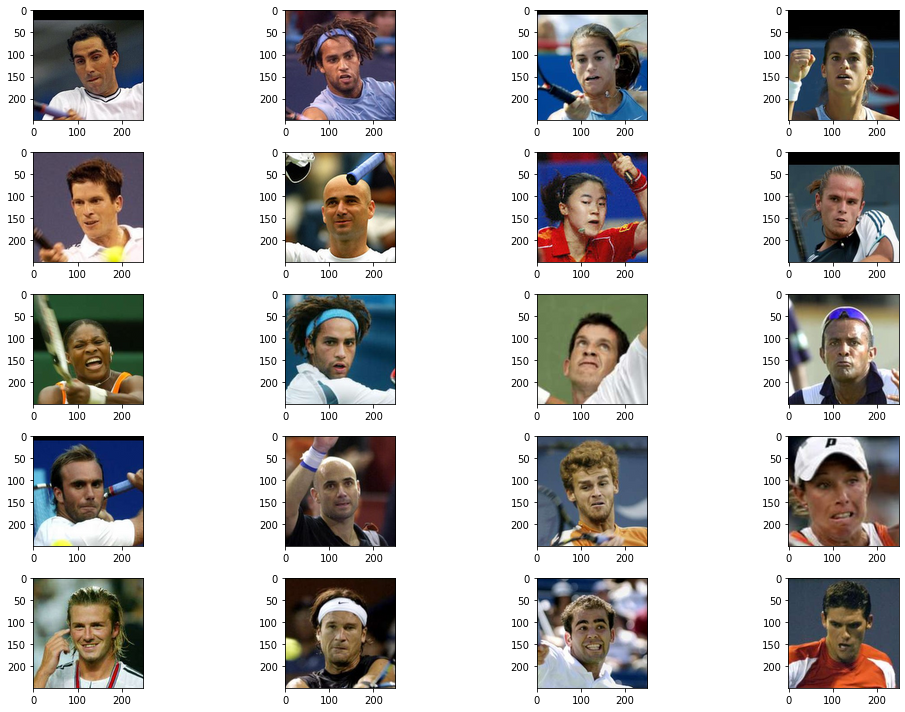

In [6]:
img_url = 'https://raw.githubusercontent.com/jerryz18/CS370/main/Albert_Costa.jpg'
img_path = 'Albert_Costa.jpg'
predict_face(img_url, img_path)

#Angela Bassett

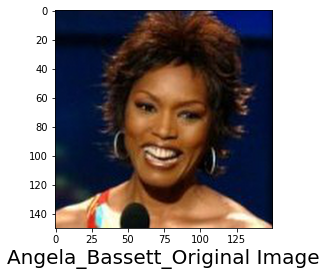

********* Predictions (without PCA) ***********


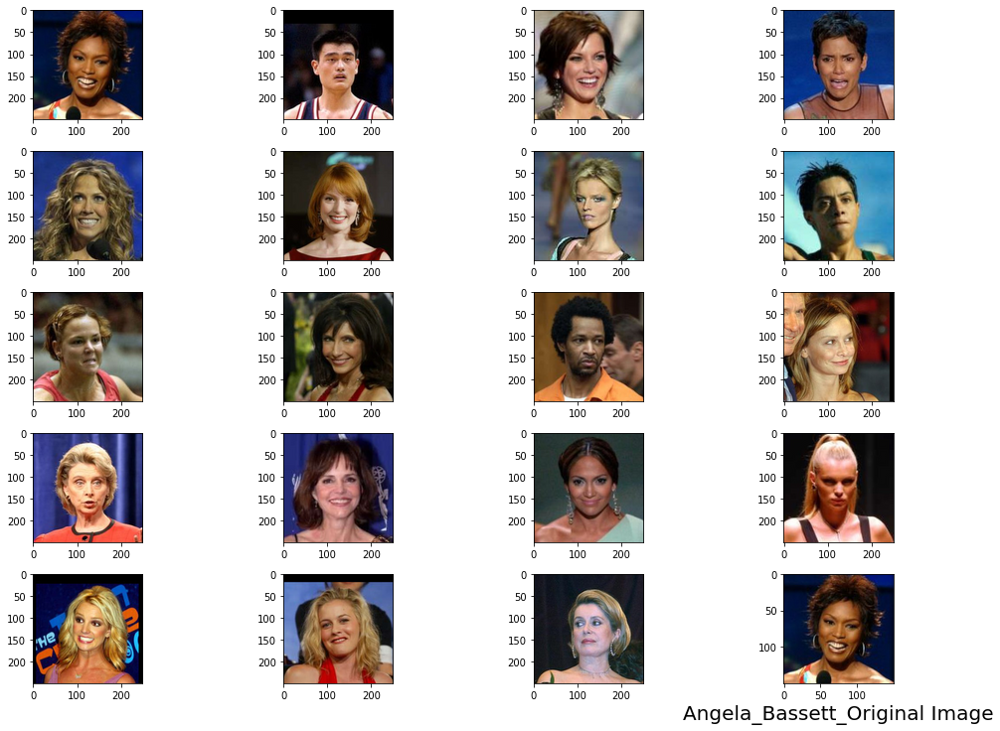

********* Predictions (with PCA) ***********


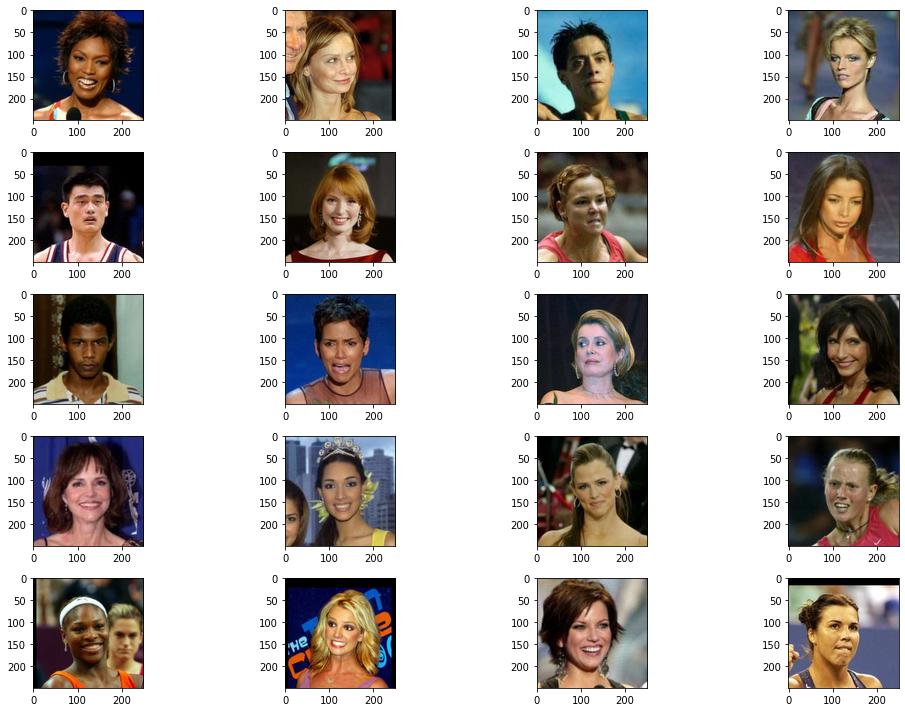

In [7]:
img_url = 'https://raw.githubusercontent.com/jerryz18/CS370/main/Angela_Bassett.jpg'
img_path = 'Angela_Bassett.jpg'
predict_face(img_url, img_path)

#Arminio Fraga 

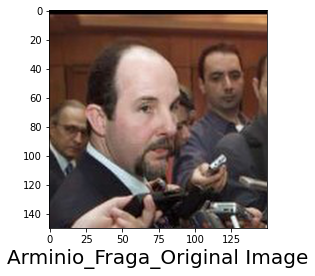

********* Predictions (without PCA) ***********


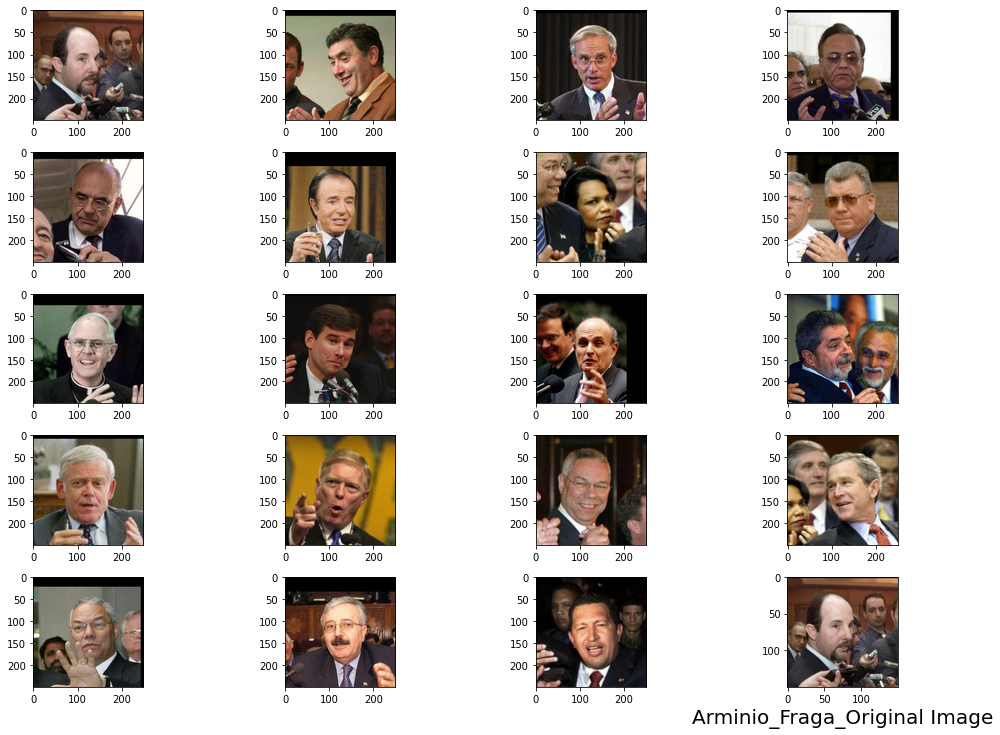

********* Predictions (with PCA) ***********


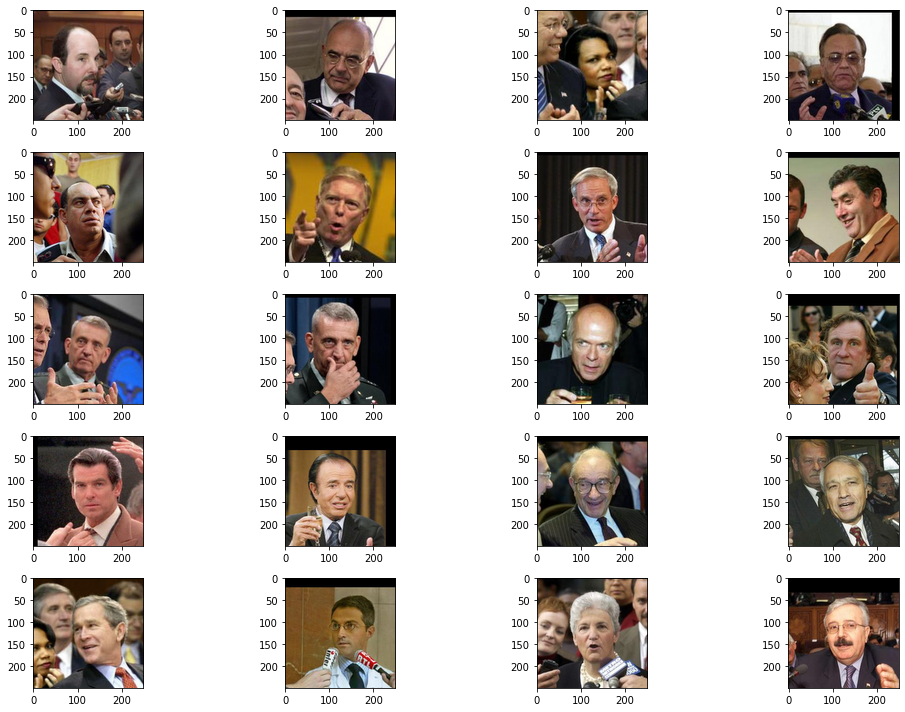

In [8]:
img_url = 'https://raw.githubusercontent.com/jerryz18/CS370/main/Arminio_Fraga.jpg'
img_path = 'Arminio_Fraga.jpg'
predict_face(img_url, img_path)

#Billy Crystal

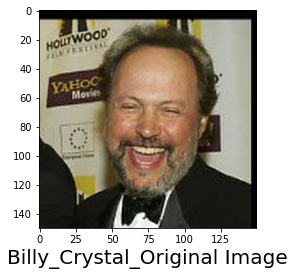

********* Predictions (without PCA) ***********


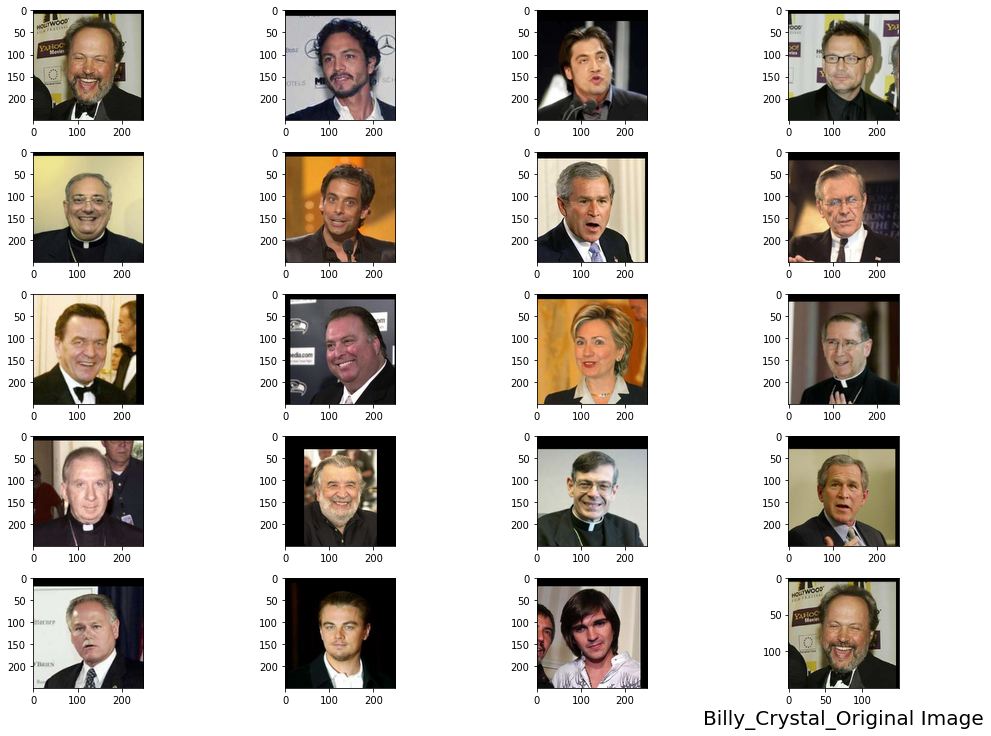

********* Predictions (with PCA) ***********


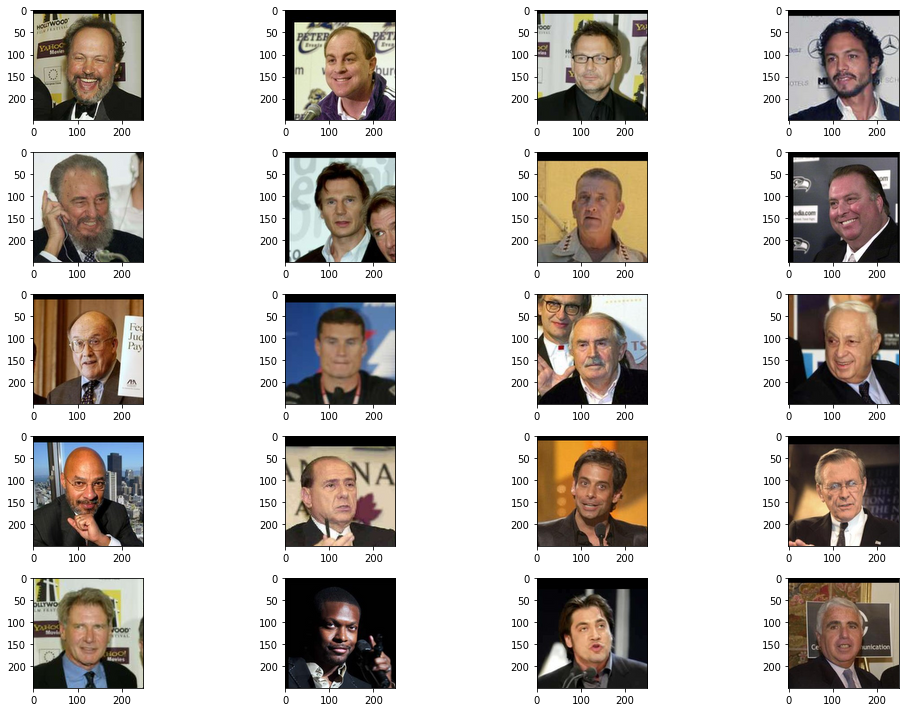

In [9]:
img_url = 'https://raw.githubusercontent.com/jerryz18/CS370/main/Billy_Crystal.jpg'
img_path = 'Billy_Crystal.jpg'
predict_face(img_url, img_path)

#Bob Graham

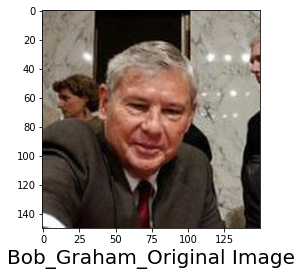

********* Predictions (without PCA) ***********


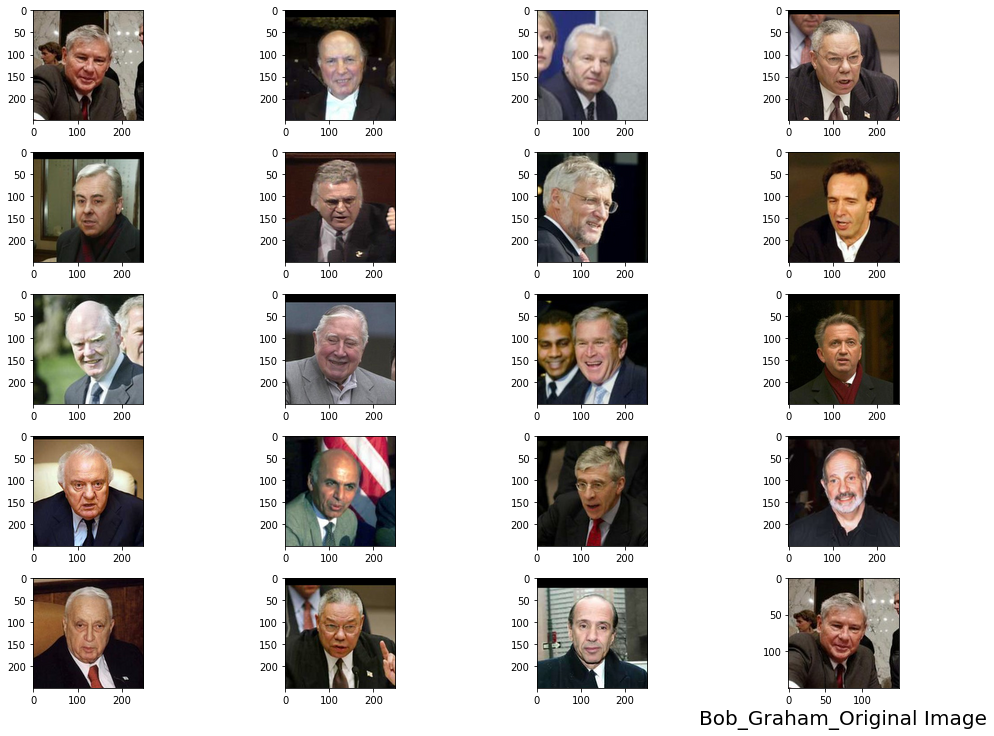

********* Predictions (with PCA) ***********


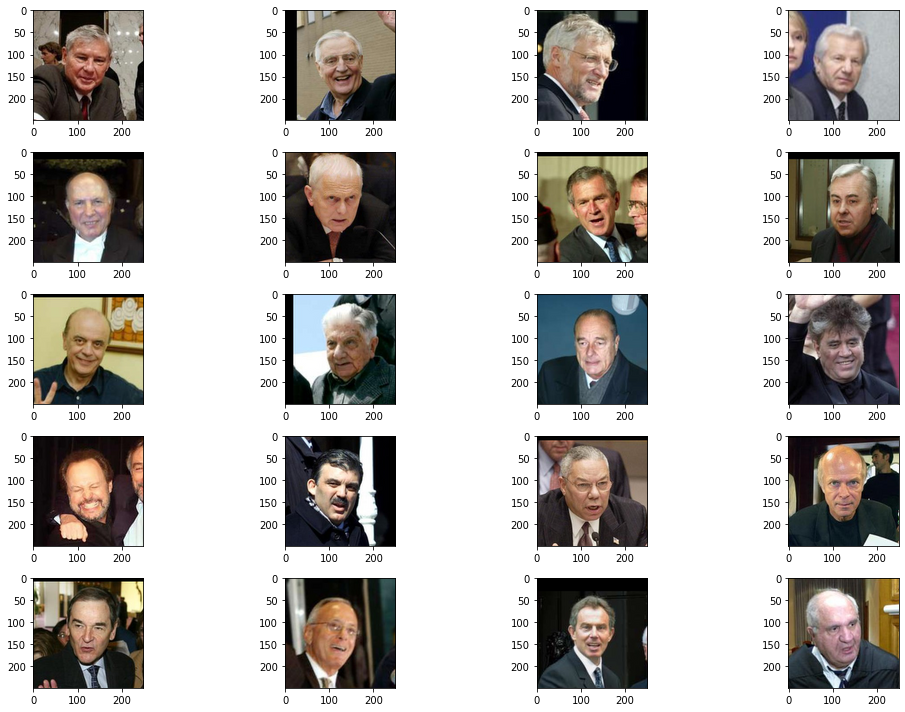

In [10]:
img_url = 'https://raw.githubusercontent.com/jerryz18/CS370/main/Bob_Graham.jpg'
img_path = 'Bob_Graham.jpg'
predict_face(img_url, img_path)

#Borris Becker

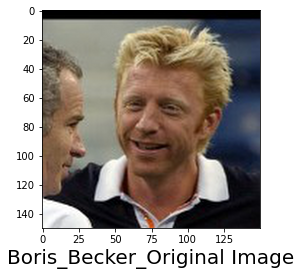

********* Predictions (without PCA) ***********


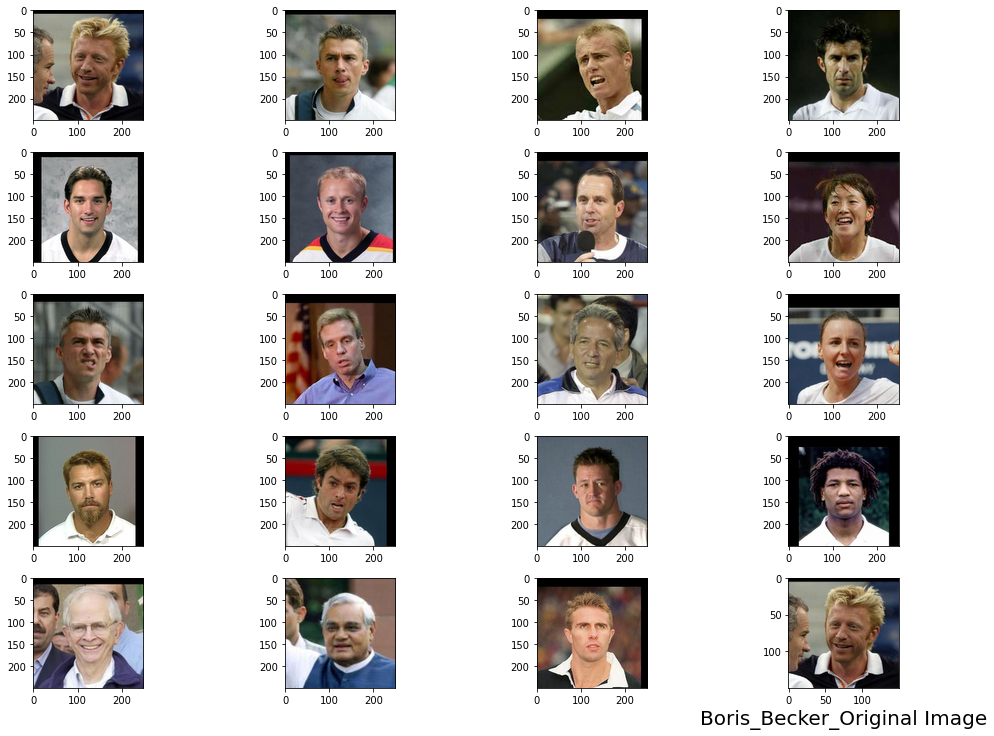

********* Predictions (with PCA) ***********


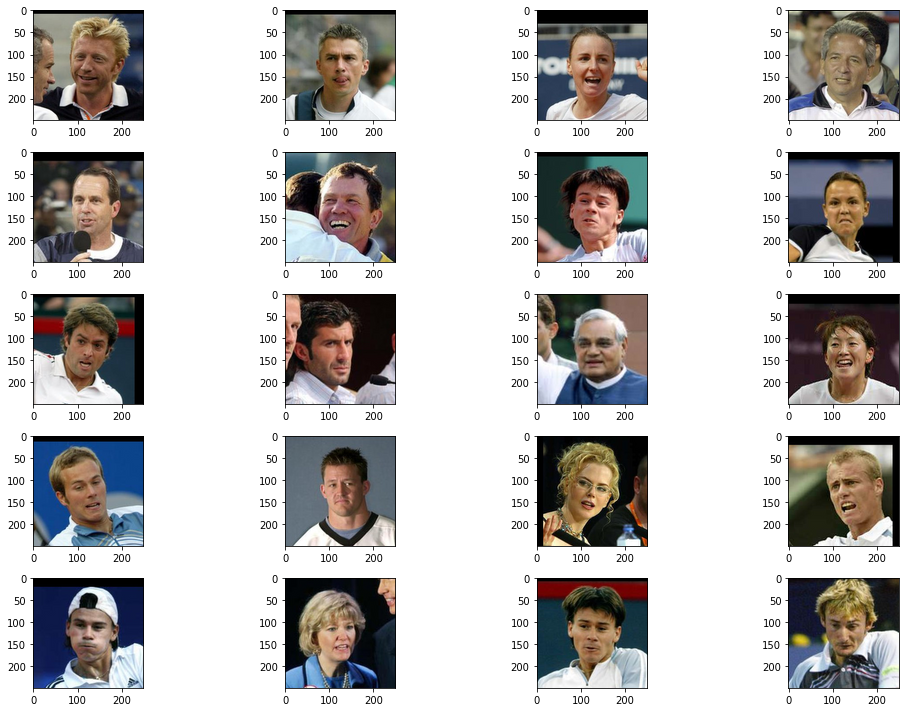

In [11]:
img_url = 'https://raw.githubusercontent.com/jerryz18/CS370/main/Boris_Becker.jpg'
img_path = 'Boris_Becker.jpg'
predict_face(img_url, img_path)

#Bulent Ecevit

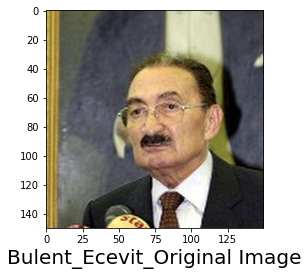

********* Predictions (without PCA) ***********


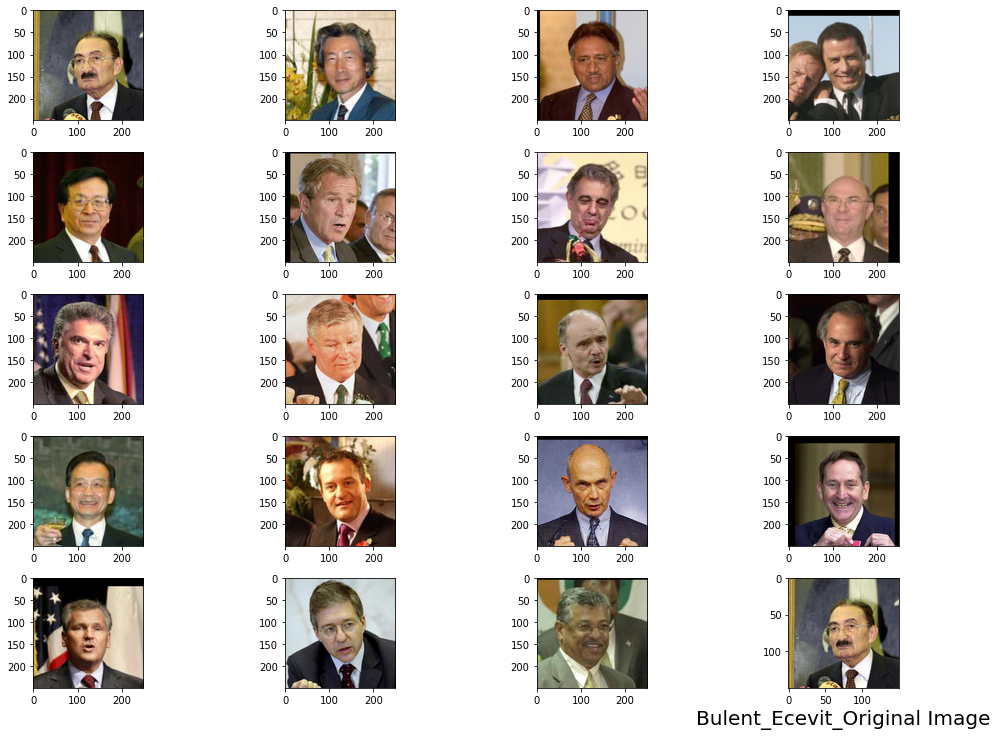

********* Predictions (with PCA) ***********


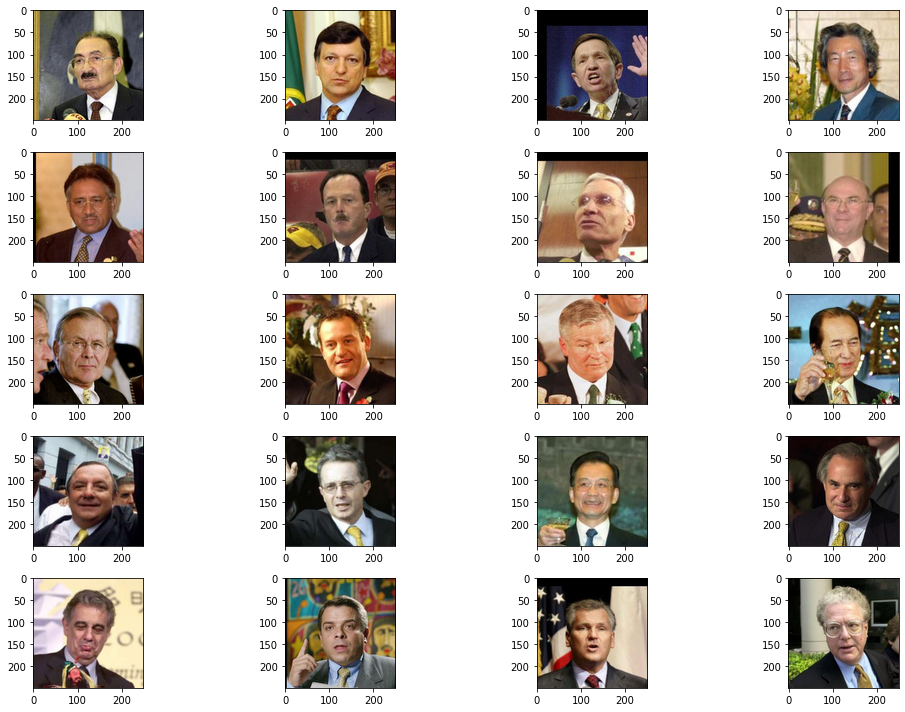

In [12]:
img_url = 'https://raw.githubusercontent.com/jerryz18/CS370/main/Bulent_Ecevit.jpg'
img_path = 'Bulent_Ecevit.jpg'
predict_face(img_url, img_path)

#Calista Flockhart

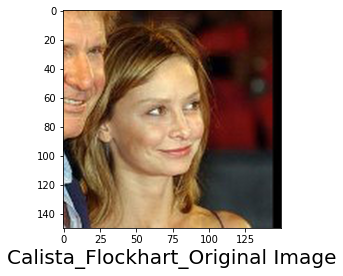

********* Predictions (without PCA) ***********


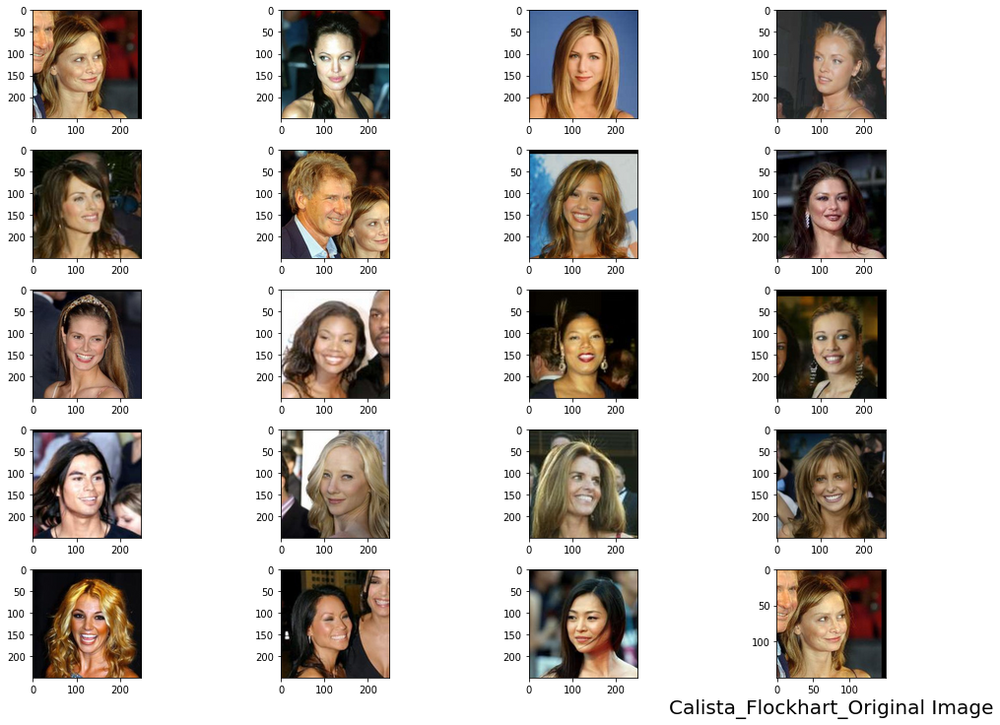

********* Predictions (with PCA) ***********


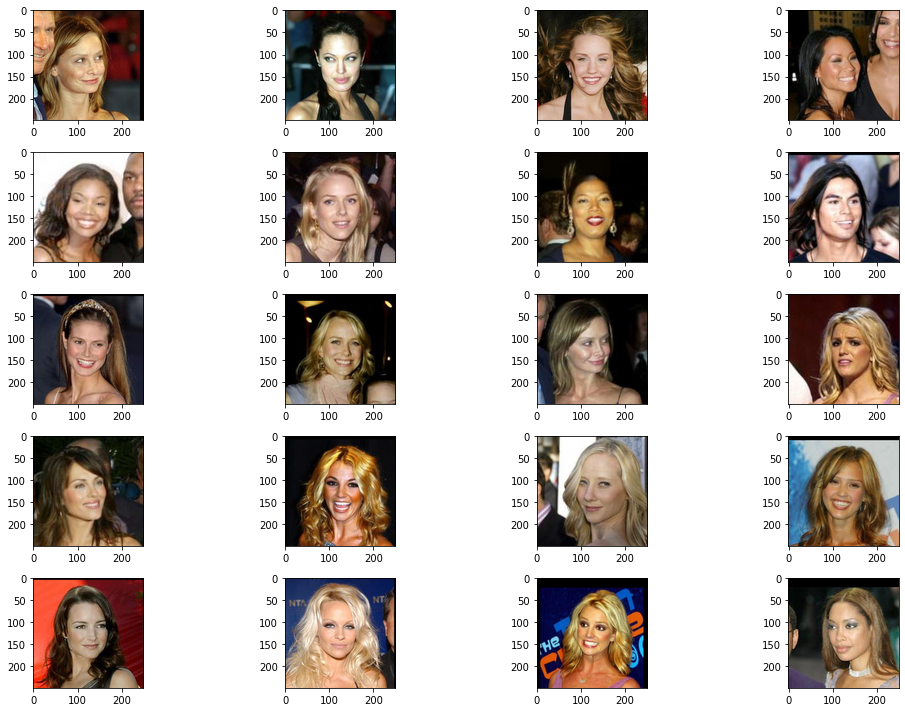

In [13]:
img_url = 'https://raw.githubusercontent.com/jerryz18/CS370/main/Calista_Flockhart.jpg'
img_path = 'Calista_Flockhart.jpg'
predict_face(img_url, img_path)

#Cameron Diaz

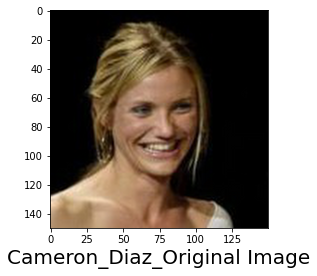

********* Predictions (without PCA) ***********


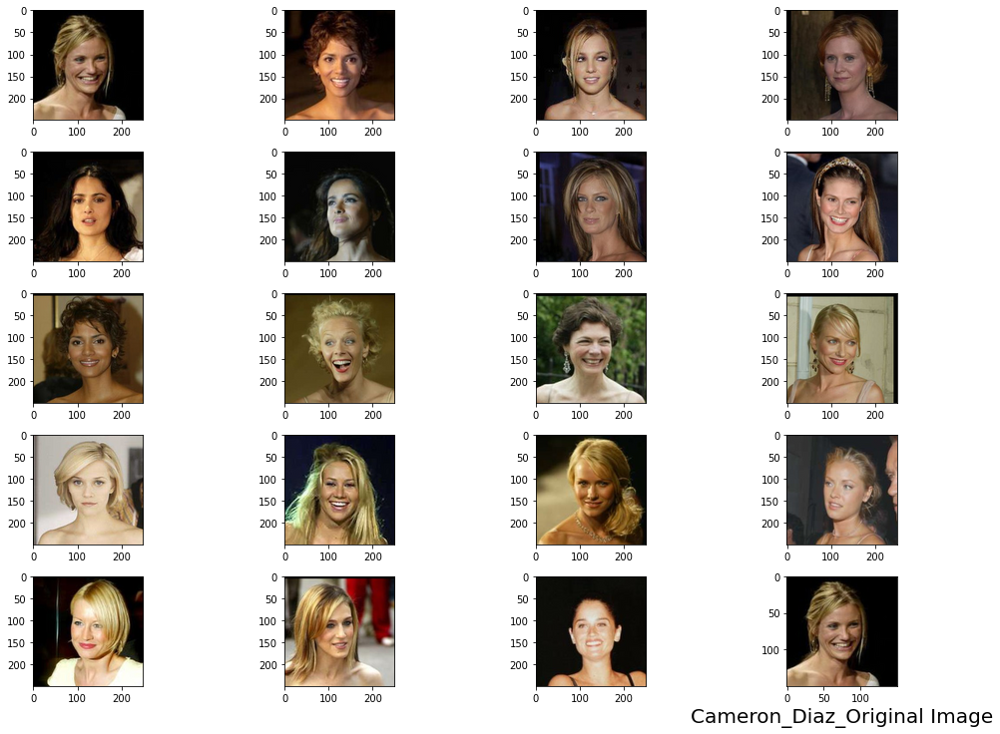

********* Predictions (with PCA) ***********


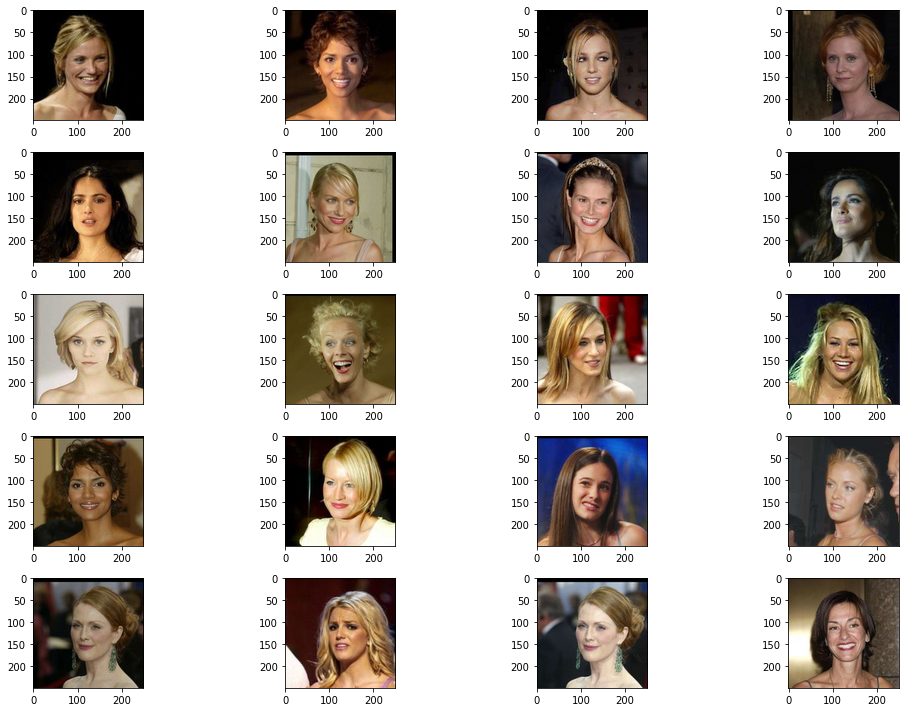

In [14]:
img_url = 'https://raw.githubusercontent.com/jerryz18/CS370/main/Cameron_Diaz.jpg'
img_path = 'Cameron_Diaz.jpg'
predict_face(img_url, img_path)

#Carmen Electra

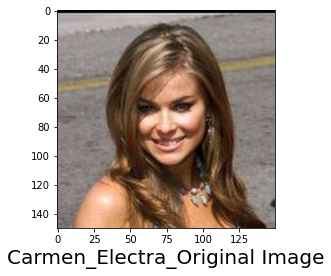

********* Predictions (without PCA) ***********


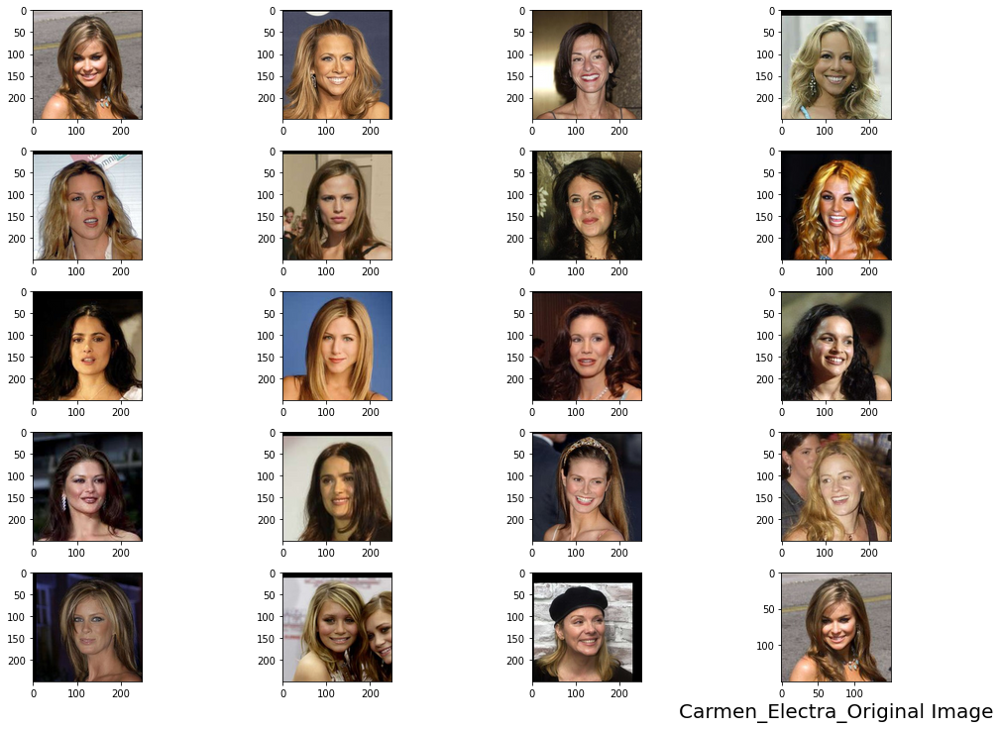

********* Predictions (with PCA) ***********


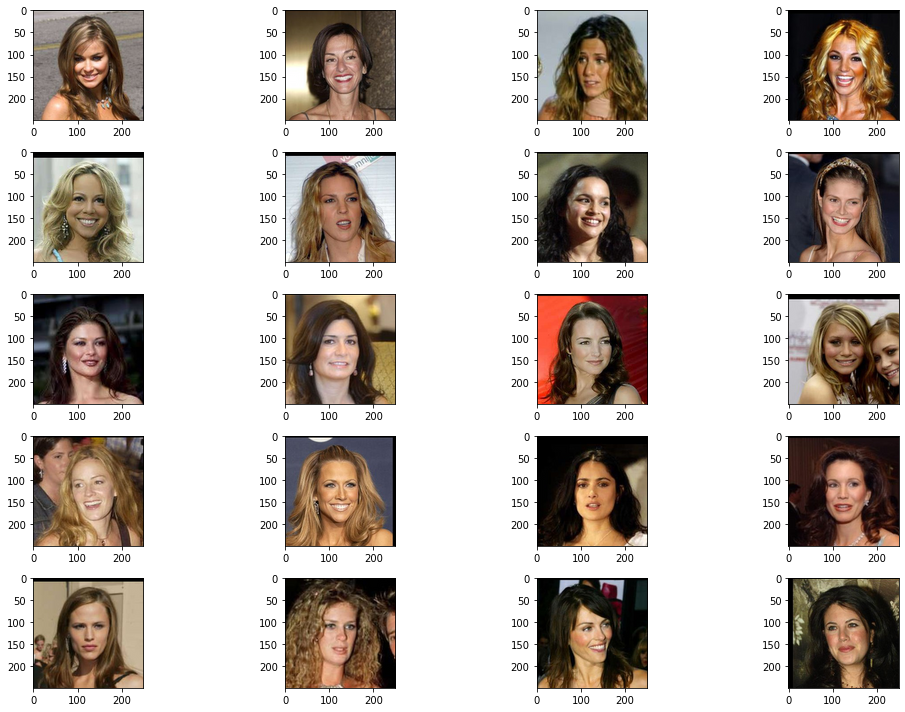

In [15]:
img_url = 'https://raw.githubusercontent.com/jerryz18/CS370/main/Carmen_Electra.jpg'
img_path = 'Carmen_Electra.jpg'
predict_face(img_url, img_path)

## Reverse Image Search Improvement (30 points)